# Occupancy Detection Using Environment Sensors

### Accessing Data
First, we will load the tidyverse library. Then, we need to download our data and save it as a tibble for future data wrangling.
Our data was only available as a .zip file, so we downloaded it, unzipped the necessary data, and read it into a CSV.

In [78]:
library(tidyverse)
library(repr)
library(tidymodels)

temp <- tempfile()
download.file("https://archive.ics.uci.edu/static/public/357/occupancy+detection.zip",temp)
data <- read.csv(unz(temp, "datatraining.txt"))
unlink(temp)

occupancyData <- tibble(data)
occupancyData

date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2015-02-04 17:51:00,23.180,27.27200,426.0,721.2500,0.004792988,1
2015-02-04 17:51:59,23.150,27.26750,429.5,714.0000,0.004783441,1
2015-02-04 17:53:00,23.150,27.24500,426.0,713.5000,0.004779464,1
2015-02-04 17:54:00,23.150,27.20000,426.0,708.2500,0.004771509,1
2015-02-04 17:55:00,23.100,27.20000,426.0,704.5000,0.004756993,1
2015-02-04 17:55:59,23.100,27.20000,419.0,701.0000,0.004756993,1
2015-02-04 17:57:00,23.100,27.20000,419.0,701.6667,0.004756993,1
2015-02-04 17:57:59,23.100,27.20000,419.0,699.0000,0.004756993,1
2015-02-04 17:58:59,23.100,27.20000,419.0,689.3333,0.004756993,1


### Selecting Necessary Columns
We don't need date, and we don't need HumidityRatio (as we already have humidity) but all other columns are necessary.

In [79]:
selectedOccupancyData <- occupancyData[,-c(1, 6)]
selectedOccupancyData

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.180,27.27200,426.0,721.2500,1
23.150,27.26750,429.5,714.0000,1
23.150,27.24500,426.0,713.5000,1
23.150,27.20000,426.0,708.2500,1
23.100,27.20000,426.0,704.5000,1
23.100,27.20000,419.0,701.0000,1
23.100,27.20000,419.0,701.6667,1
23.100,27.20000,419.0,699.0000,1
23.100,27.20000,419.0,689.3333,1


### Splitting Data For Training / Testing
Now that we have only the necessary columns, we will continue to split the data into training and testing sets.
We will use a 75/25 split.

In [80]:
occupancy_split <- initial_split(selectedOccupancyData, prop = 0.75, strata = Occupancy)  
occupancy_train <- training(occupancy_split)
occupancy_test <- testing(occupancy_split)

occupancy_train
occupancy_test

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.00000,27.20000,0,681.5000,0
22.94500,27.29000,0,685.0000,0
22.94500,27.39000,0,685.0000,0
22.89000,27.39000,0,689.0000,0
22.89000,27.39000,0,689.5000,0
22.89000,27.44500,0,691.0000,0
22.89000,27.50000,0,688.0000,0
22.89000,27.50000,0,689.5000,0
22.79000,27.44500,0,689.0000,0


Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.18000,27.27200,426.0,721.2500,1
23.10000,27.20000,419.0,701.0000,1
23.10000,27.10000,419.0,691.0000,1
23.05000,27.15000,419.0,687.5000,1
23.00000,27.12500,418.5,680.5000,1
22.89000,27.39000,0.0,689.0000,0
22.79000,27.50000,0.0,688.0000,0
22.70000,27.46333,0.0,668.6667,0
22.70000,27.60000,0.0,670.0000,0


### Summarizing the Data
We will summarize the data, counting the various values and checking for empty/NA

In [81]:
# Summarizing the data
summary_table <- occupancy_train |>
    # Summarize each column
    summarise(
        Total_Observations = n(),
        Missing_Temperature = sum(is.na(Temperature)),
        Mean_Temperature = mean(Temperature, na.rm = TRUE),
        Missing_Humidity = sum(is.na(Humidity)),
        Mean_Humidity = mean(Humidity, na.rm = TRUE),
        Missing_Light = sum(is.na(Light)),
        Mean_Light = mean(Light, na.rm = TRUE),
        Missing_CO2 = sum(is.na(CO2)),
        Mean_CO2 = mean(CO2, na.rm = TRUE),
        Occupancy_Count_0 = sum(Occupancy == 0, na.rm = TRUE),
        Occupancy_Count_1 = sum(Occupancy == 1, na.rm = TRUE))

# View the summary table
summary_table

Total_Observations,Missing_Temperature,Mean_Temperature,Missing_Humidity,Mean_Humidity,Missing_Light,Mean_Light,Missing_CO2,Mean_CO2,Occupancy_Count_0,Occupancy_Count_1
<int>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<int>
6106,0,20.61666,0,25.72889,0,119.1667,0,605.2053,4810,1296


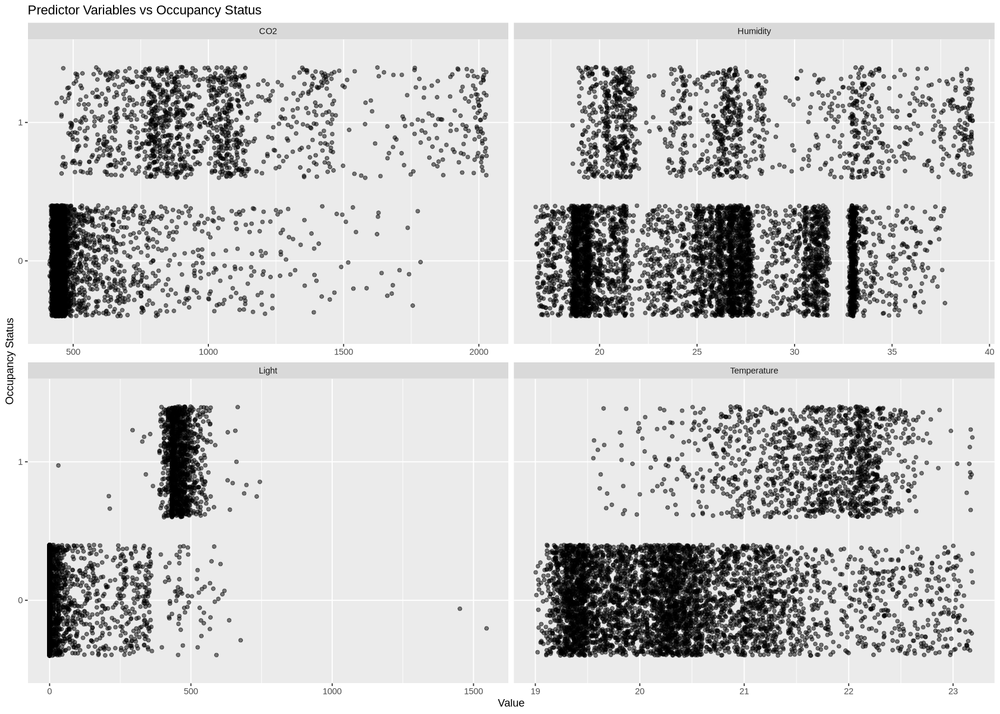

In [82]:
options(repr.plot.width=14, repr.plot.height=10)

# Reshape data to long format for faceting
occupancy_long <- occupancy_train |>
    pivot_longer(cols = -Occupancy, names_to = "variable", values_to = "value")

# Create a 2x2 grid of scatterplots with jitter
combined_plot <- ggplot(occupancy_long, aes(x = value, y = as.factor(Occupancy))) +
    geom_jitter(alpha = 0.5, width = 0.1) +
    facet_wrap(~variable, scales = "free_x", ncol = 2) +
    labs(x = "Value", y = "Occupancy Status", title = "Predictor Variables vs Occupancy Status")

# Print the combined plot
print(combined_plot)